# Color selection and Gradient level selection

In [1]:
# Increase the width to full screen.
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## Read Camera Calibration values

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [3]:
import pickle
camera_calibration = pickle.load(open('./pickle_data/camera_calibration.p', 'rb'))
mtx = camera_calibration['mtx']
dist = camera_calibration['dist']


## See All Images

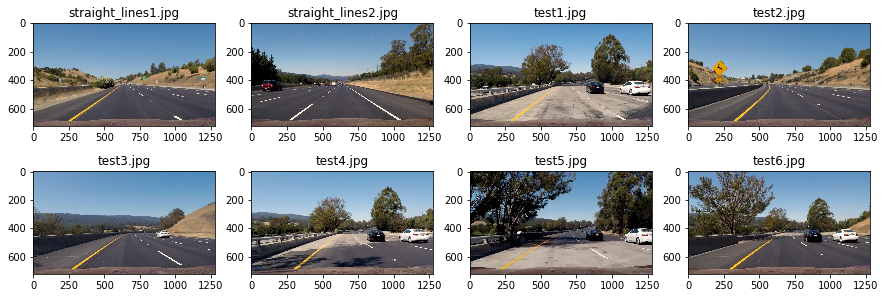

In [4]:
import os
file_names = sorted(os.listdir('./test_images'))

image_list = []
for image_file_name in file_names:
    image_list.append(mpimg.imread(os.path.join('./test_images', image_file_name)))
    
    
import matplotlib.pyplot as plt
import math

fig=plt.figure(figsize=(15, 5))
columns = 4
rows = (len(image_list) + columns - 1) // columns
for i in range(0, columns*rows):
    fig.add_subplot(rows, columns, i+1)
    plt.title(file_names[i])
    plt.imshow(image_list[i])
plt.show()

## Undistort images

In [5]:
undistorted_image_list = []

for img in image_list:
  undistorted_image_list.append(cv2.undistort(img, mtx, dist, None, mtx))

## Show all undistorted images

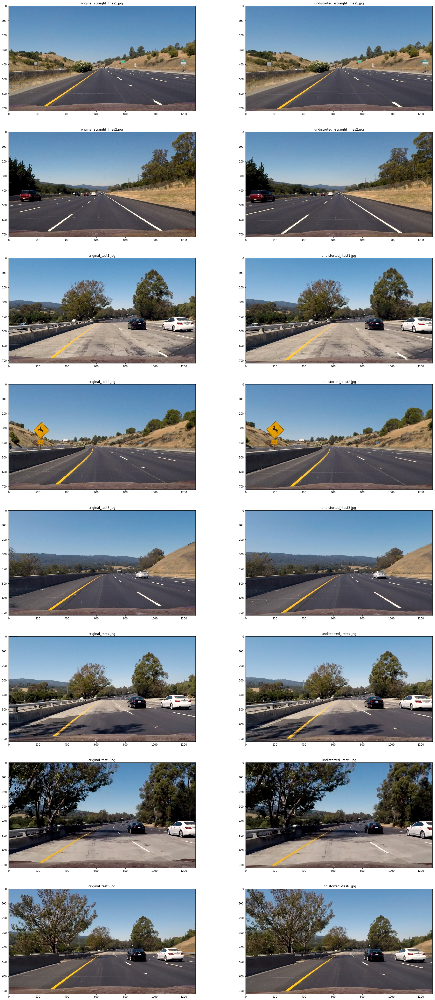

In [6]:
import matplotlib.pyplot as plt

num_images = len(file_names)

fig=plt.figure(figsize=(30, 70))
columns = 2
rows = num_images
for i in range(num_images):
    fig.add_subplot(rows, columns, 2*i+1)
    plt.title('original_' + file_names[i])
    plt.imshow(image_list[i])
    fig.add_subplot(rows, columns, 2*i+2)
    plt.title('undistorted_-' + file_names[i])
    plt.imshow(undistorted_image_list[i])
    
plt.show()

## Display HLS channels for a single image

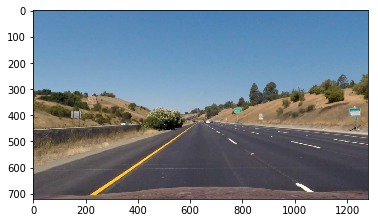

In [7]:
image = undistorted_image_list[0]
gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
plt.imshow(image)

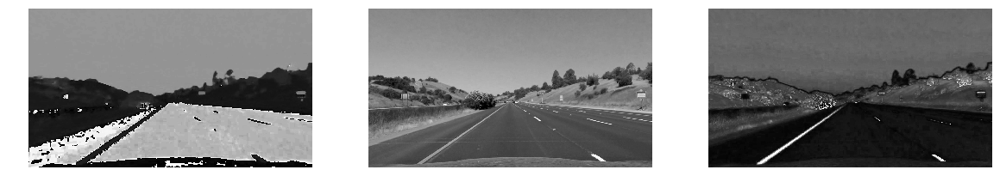

In [8]:
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

fig, axes = plt.subplots(ncols=3, figsize=(20,10))
for index, a in enumerate(axes):
    a.imshow(hls[:,:,index], cmap='gray')
    a.axis('off')

## Display RGB channels

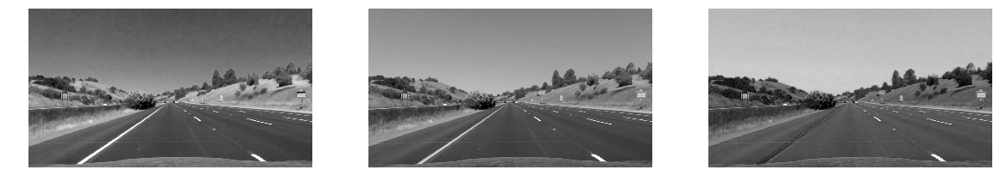

In [9]:
fig, axes = plt.subplots(ncols=3, figsize=(20,10))
for index, a in enumerate(axes):
    a.imshow(image[:,:,index], cmap='gray')
    a.axis('off')

## Display Gradient of image

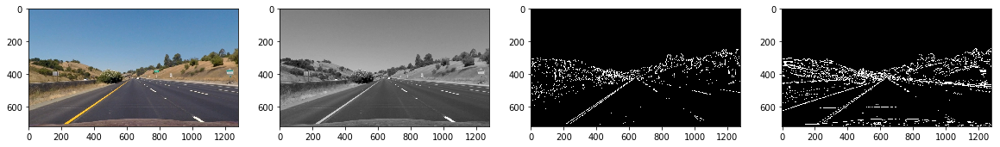

In [10]:
# For single direction
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # Return the result
    return binary_output

fig, axes = plt.subplots(ncols=4, figsize=(20,10))
axes = iter(axes)
next(axes).imshow(image)
next(axes).imshow(gray, cmap='gray')
next(axes).imshow(abs_sobel_thresh(image,  orient='x', thresh_min=20, thresh_max=100), cmap='gray')
next(axes).imshow(abs_sobel_thresh(image,  orient='y', thresh_min=20, thresh_max=100), cmap='gray')


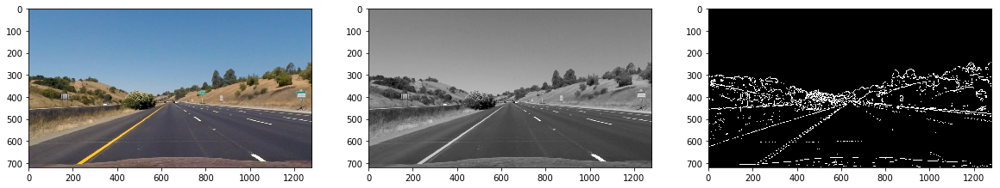

In [11]:
# Considering Magnitude, i.e. both x and y are taken into account
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    # Return the binary image
    return binary_output

fig, axes = plt.subplots(ncols=3, figsize=(20,10))
axes = iter(axes)
next(axes).imshow(image)
next(axes).imshow(gray, cmap='gray')
next(axes).imshow(mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100)), cmap='gray')


## Display Direction of line points

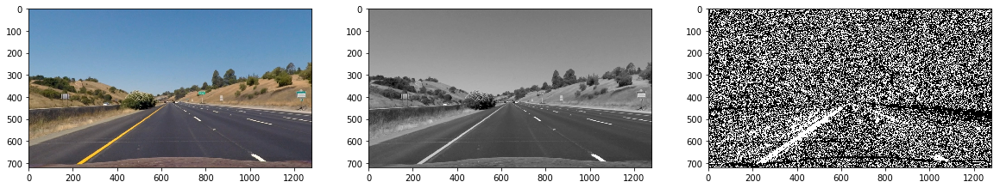

In [12]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output

fig, axes = plt.subplots(ncols=3, figsize=(20,10))
axes = iter(axes)
next(axes).imshow(image)
next(axes).imshow(gray, cmap='gray')
next(axes).imshow(dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3)), cmap='gray')

## Displaying a combined Image

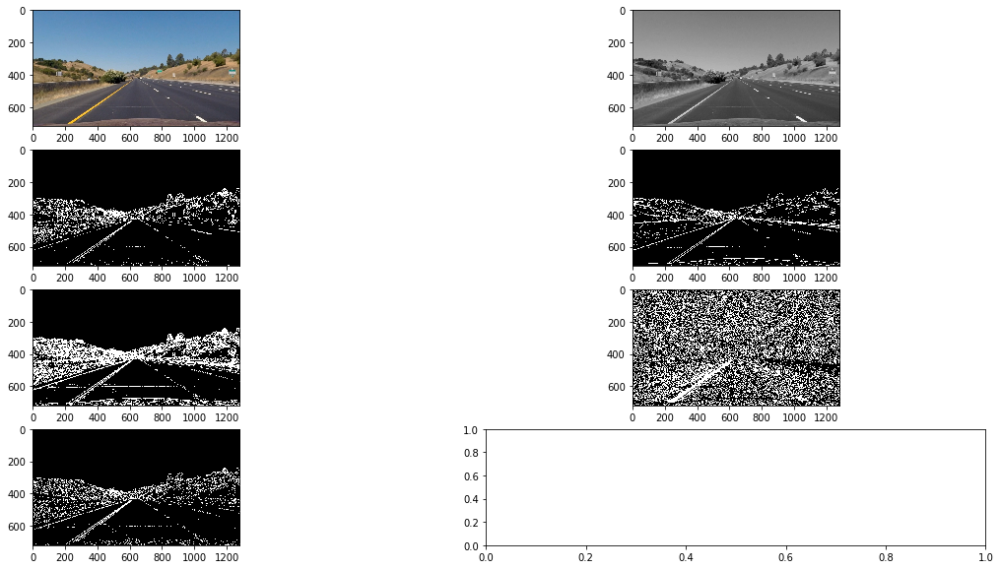

In [13]:
combined = np.zeros_like(gray)

gradx = abs_sobel_thresh(image,  orient='x', thresh_min=10, thresh_max=150)
grady = abs_sobel_thresh(image,  orient='y', thresh_min=20, thresh_max=150)
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(10, 150))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1                           
                           
fig, axes = plt.subplots(ncols=2, nrows=4, figsize=(20,10))
axes = iter(axes.flat)
next(axes).imshow(image)
next(axes).imshow(gray, cmap='gray')
next(axes).imshow(gradx, cmap='gray')
next(axes).imshow(grady, cmap='gray')
next(axes).imshow(mag_binary, cmap='gray')
next(axes).imshow(dir_binary, cmap='gray')
next(axes).imshow(combined, cmap='gray')
